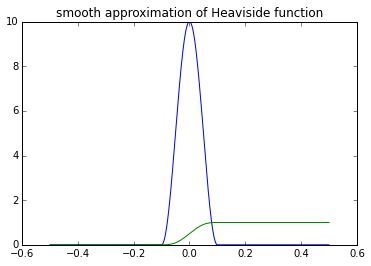

In [324]:
# smooth approximation of Dirac function
x = np.linspace(-.5, .5, 1000)
eps = .1
y = np.zeros_like(x)
y[np.abs(x)<eps] = 1./(2*eps)*(1+np.cos(np.pi*x[np.abs(x)<eps]/eps))
plt.plot(x, y);
plt.title('smooth approximation of Dirac function');


# smooth approximation of Heaviside function
x = np.linspace(-.5, .5, 1000)
eps = .1
y = np.zeros_like(x)
y[np.abs(x)<eps] = .5*(1+x[np.abs(x)<eps]/eps+ 1./np.pi*np.sin(np.pi*x[np.abs(x)<eps]/eps))
y[x >= eps] = 1
y[x <= -eps] = 0
plt.plot(x, y);
plt.title('smooth approximation of Heaviside function');

In [1]:
%load_ext autoreload
%autoreload 2

import os
import time

import sys
sys.path.append(os.path.join(os.environ['GORDON_REPO_DIR'], 'utilities'))
from utilities2015 import *

sys.path.append('/home/yuncong/project/opencv-2.4.9/release/lib/python2.7/site-packages')
import cv2

from joblib import Parallel, delayed

from skimage.color import gray2rgb
from skimage.util import img_as_float, pad
from skimage.morphology import disk
from skimage.filters.rank import gradient

import matplotlib.pyplot as plt
%matplotlib inline

In [296]:
img = imread('cameraman.gif').astype(np.float)

In [308]:
img = img_as_ubyte(rgb2gray(imread('brainstem.png'))).astype(np.float)
# img = img[60:60+100, 1178:1178+100]

In [309]:
dI_dy, dI_dx = np.gradient(gaussian_filter(img, 2))
beta = 1.
g = 1./(1. + beta*(dI_dy**2 + dI_dx**2))

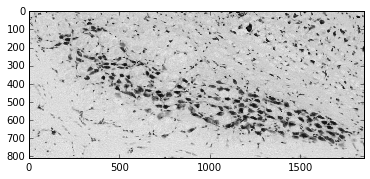

In [310]:
plt.imshow(img, plt.cm.gray);

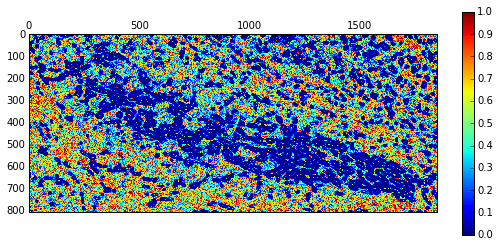

In [311]:
plt.matshow(g);
plt.colorbar();

In [312]:
f = img.copy()

0
c1 is nan


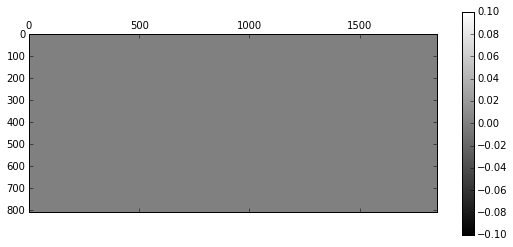

1


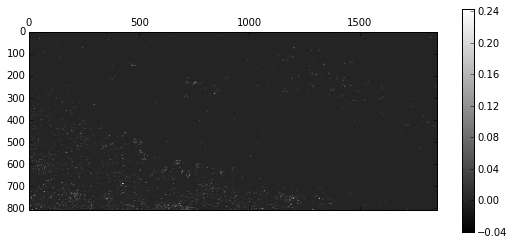

2


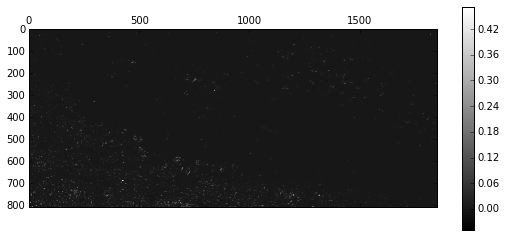

0.229835117475
3


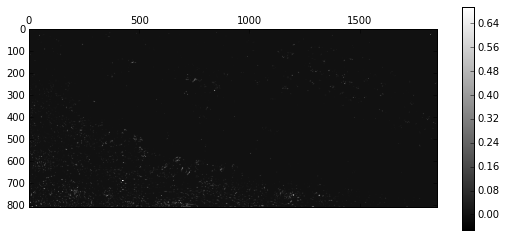

0.222811151683
4


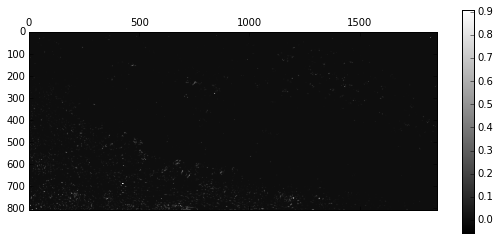

0.213875772922
5


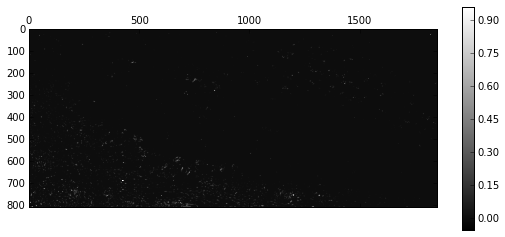

0.175794204671
6


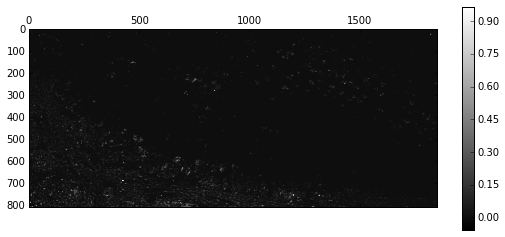

0.160965886963
7


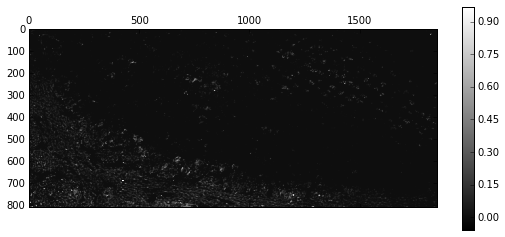

0.132230054474
8


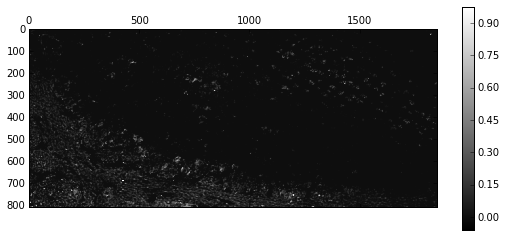

0.132236993119
9


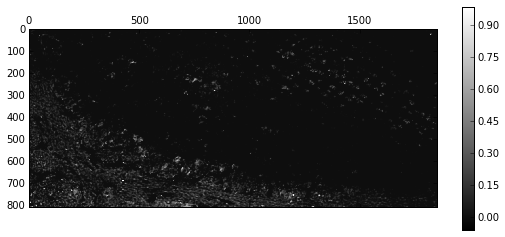

0.127333548181
10


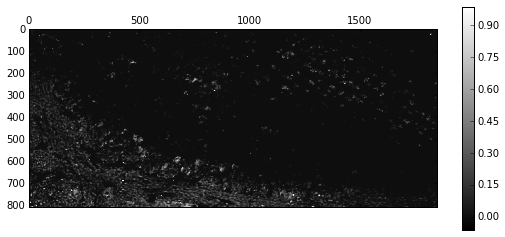

0.136345554609
11


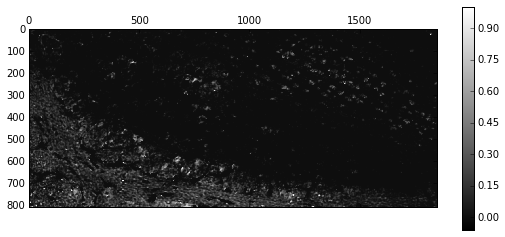

0.128792622382
12


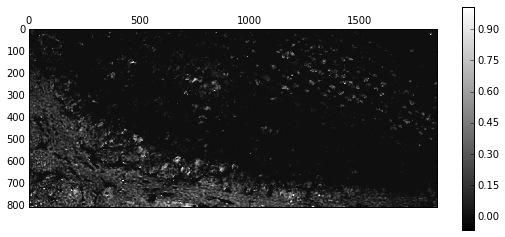

0.127557856982
13


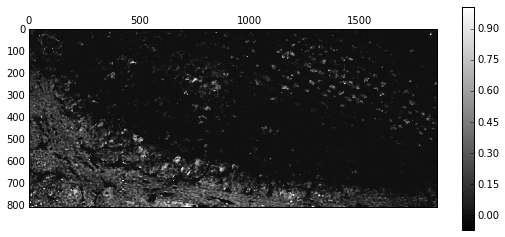

0.126266573486
14


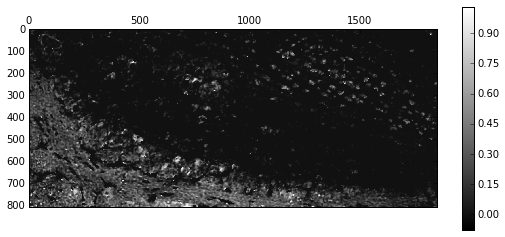

0.12812329818
15


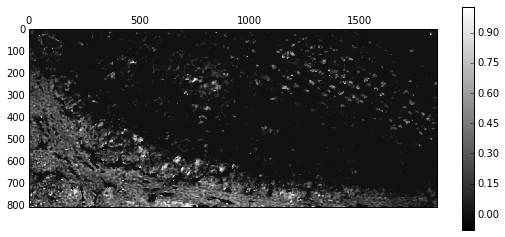

0.146587246407
16


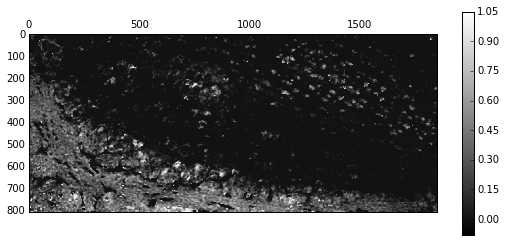

0.143398571362
17


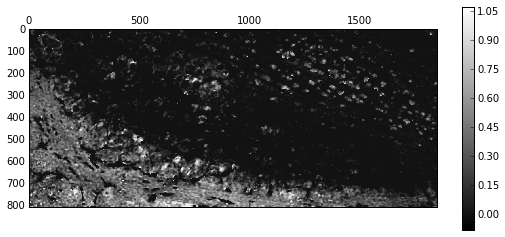

0.134811261198
18


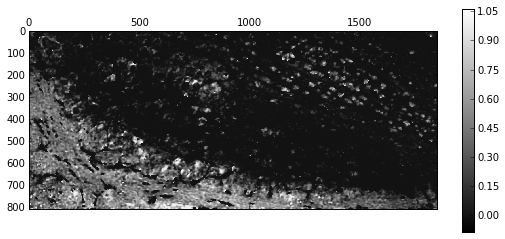

0.116801154727
19


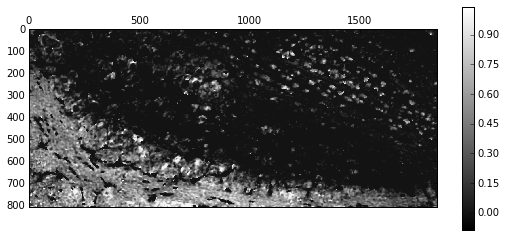

0.123886032285
20


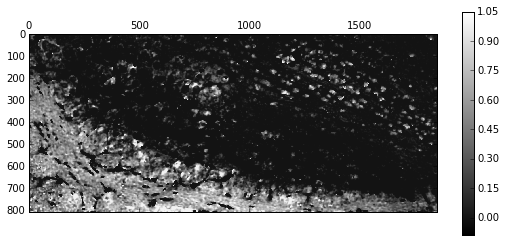

0.138958321279
21


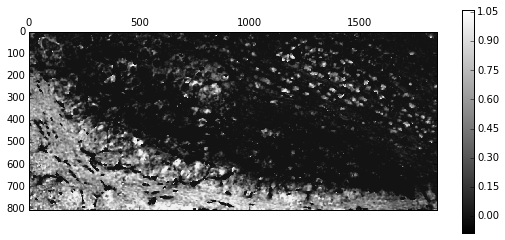

0.12070071691
22


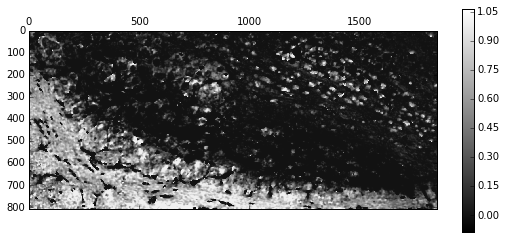

0.116566963761
23


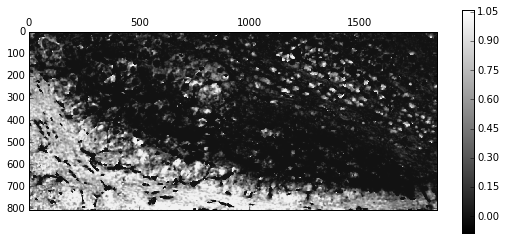

0.112014480437
24


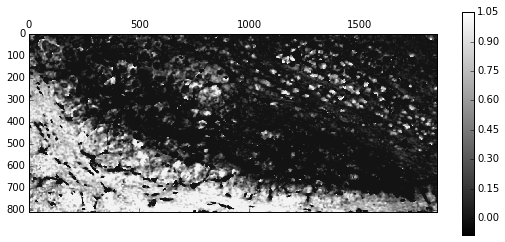

0.122290420492
25


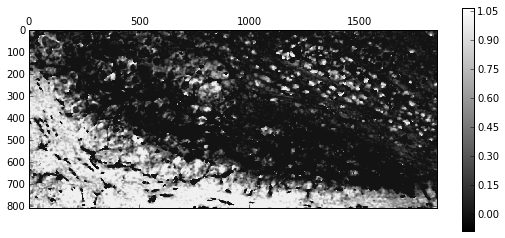

0.152294540096
26


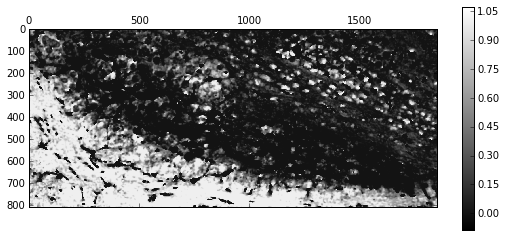

0.158858097165
27


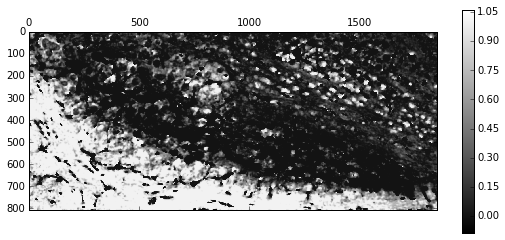

0.161936416191
28


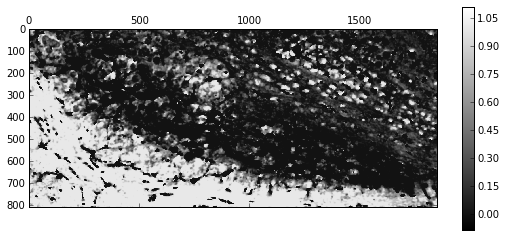

0.129392233893
29


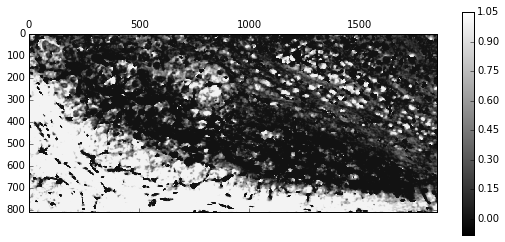

0.115635160767
30


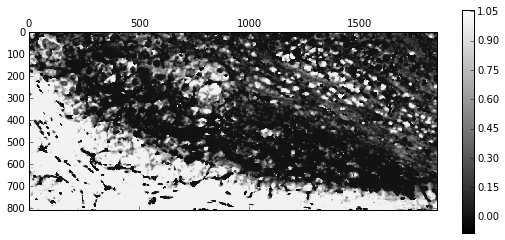

0.135025483976
31


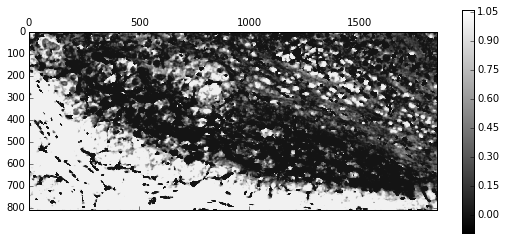

0.137369957876
32


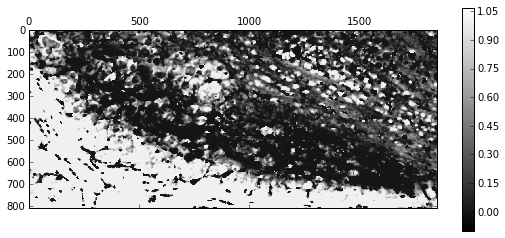

0.140158109961
33


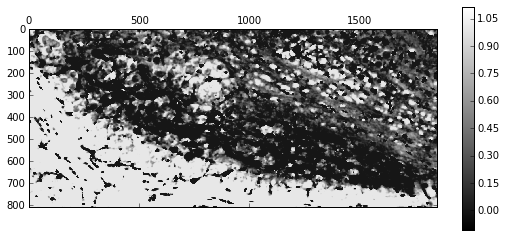

0.130725535651
34


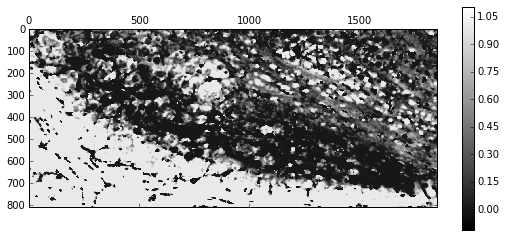

0.127290025779
35


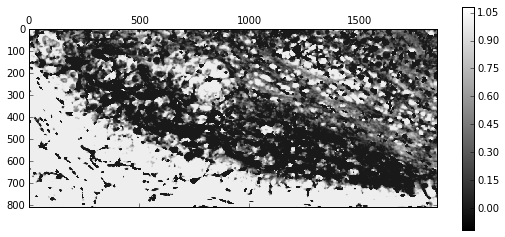

0.152280955785
36


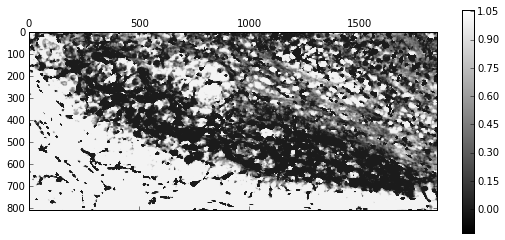

0.189082243305
37


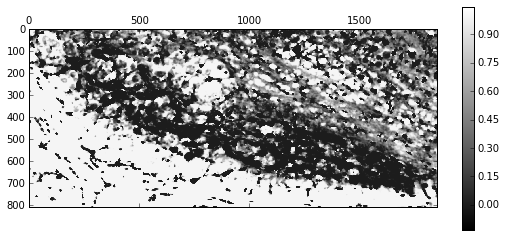

0.17415746658
38


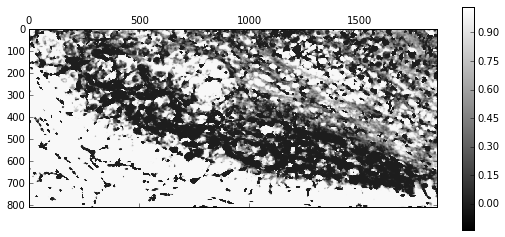

0.146488055032
39


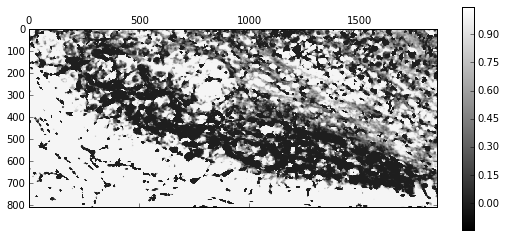

0.174792538745
40


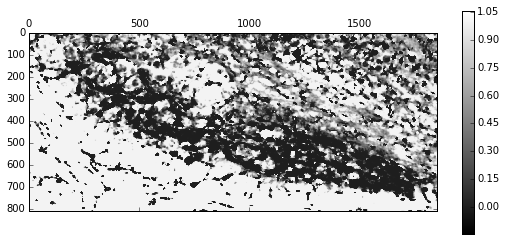

0.182967856676
41


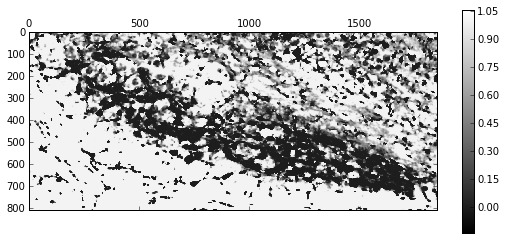

0.218984201123
42


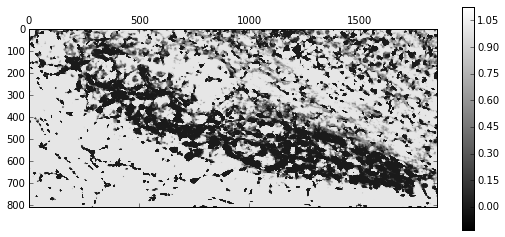

0.211316450475
43


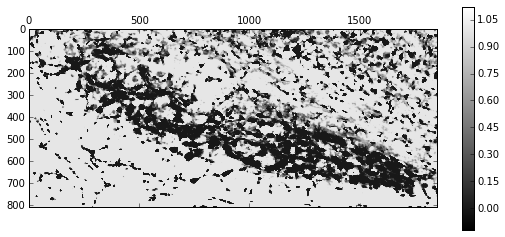

0.188415961666
44


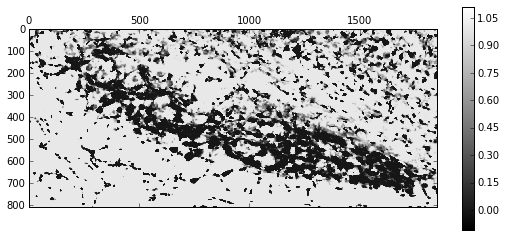

0.172947501153
45


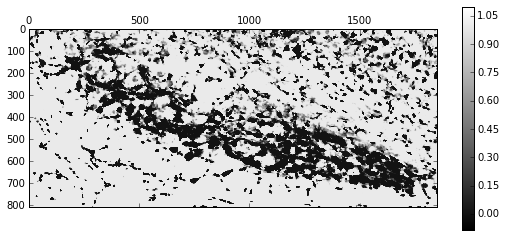

0.279281373201
46


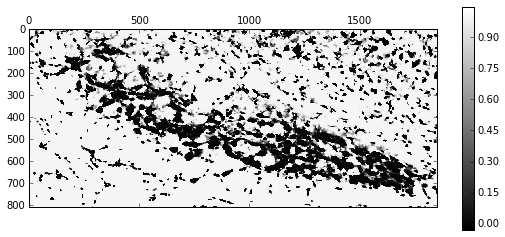

0.341318889496
47


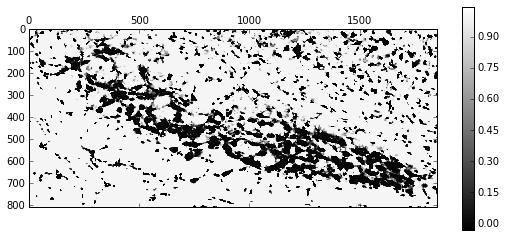

0.306830174587
48


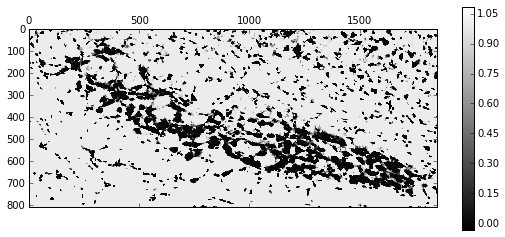

0.274648439333
49


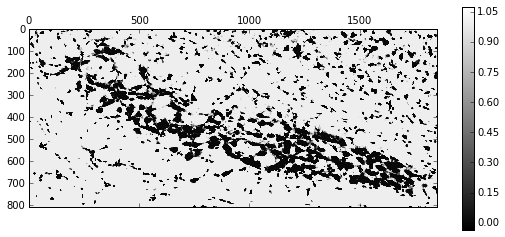

0.373736368455
50


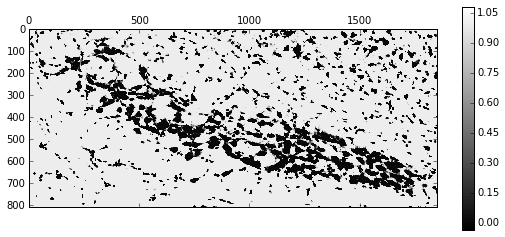

0.341862334653
51


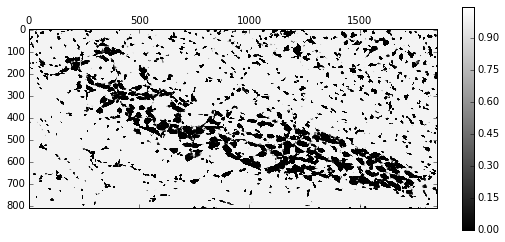

0.395057593453
52


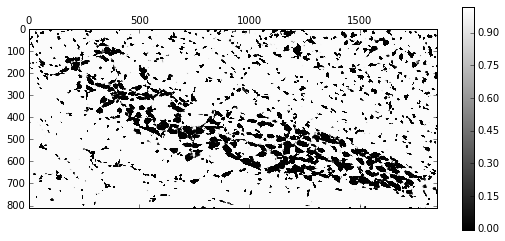

0.273663787986
53


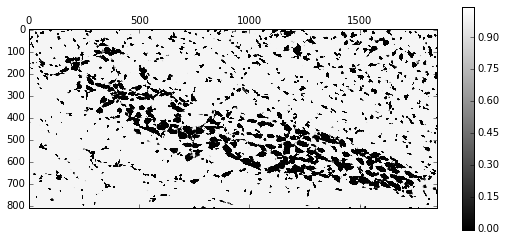

0.230098777275
54


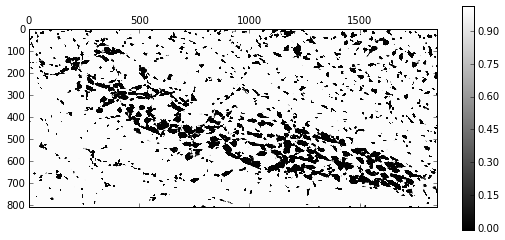

0.206772655378
55


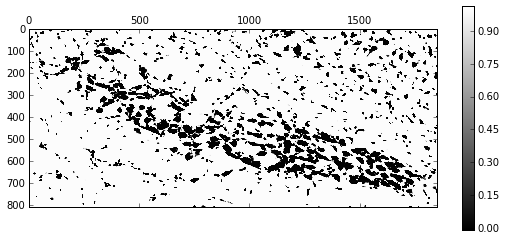

0.276912805482
56


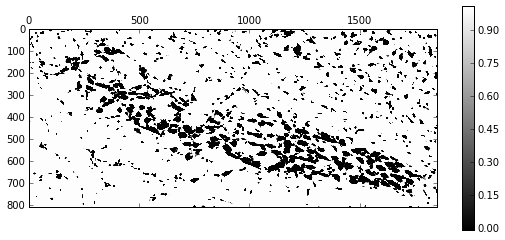

0.272063365092
57


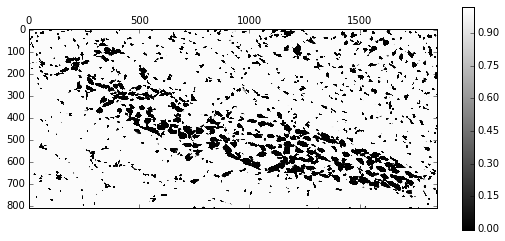

0.22703224793
58


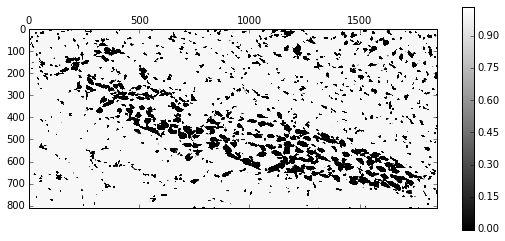

0.223207652534
59


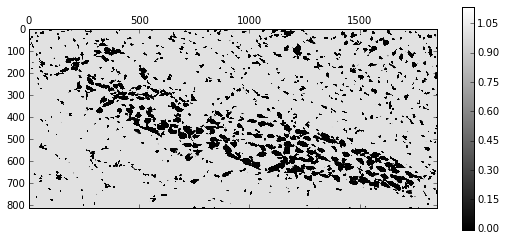

0.228633218207
60


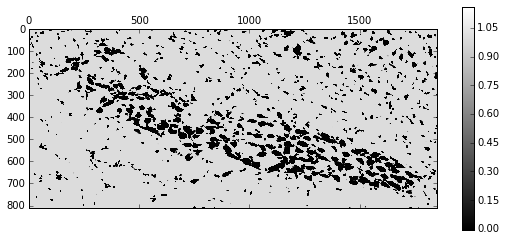

0.248185487717
61


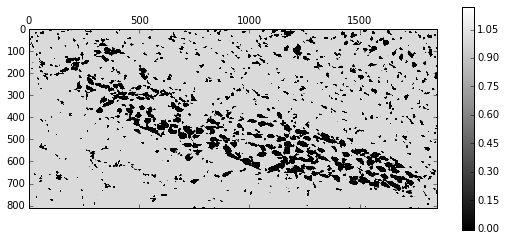

0.291482454099
62


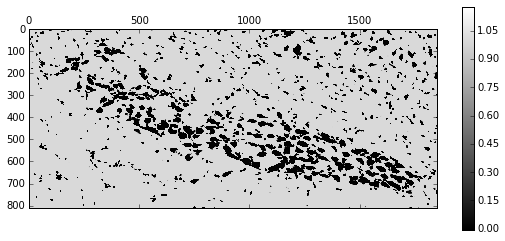

0.19721683998
63


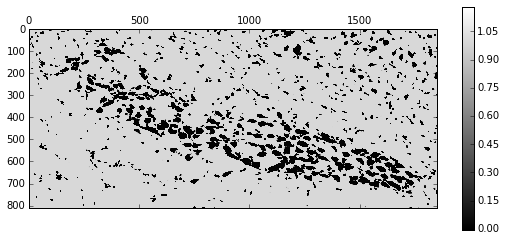

0.182813445729
64


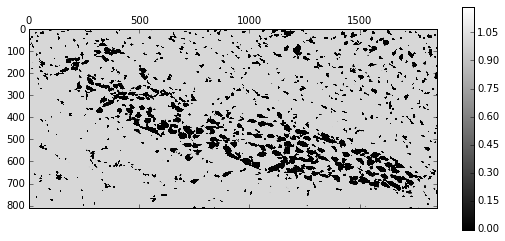

0.143740859519
65


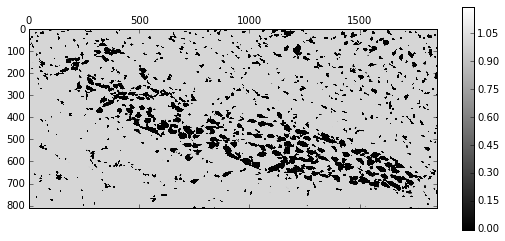

0.156035017001
66


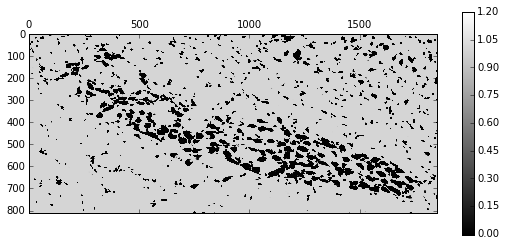

0.150919177823
67


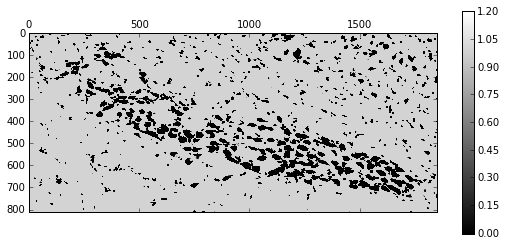

0.139382300152
68


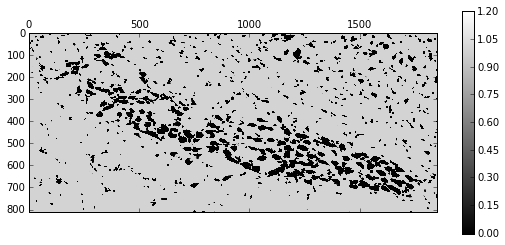

0.135077738175
69


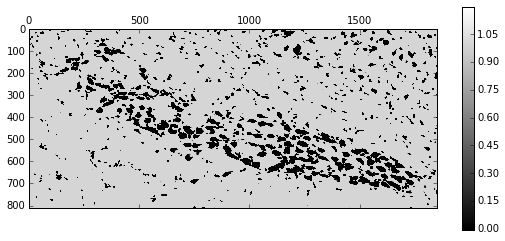

0.118882169039
70


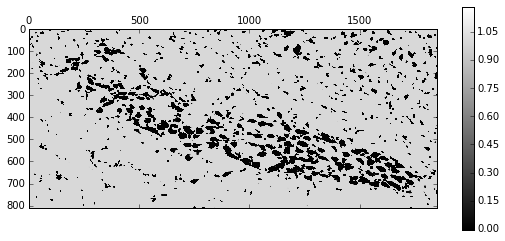

0.123430803787
71


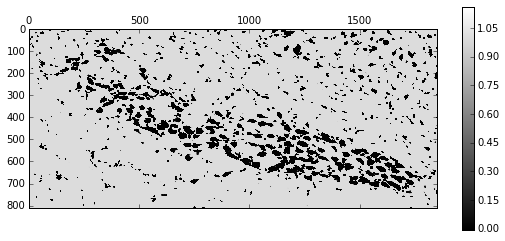

0.122898078036
72


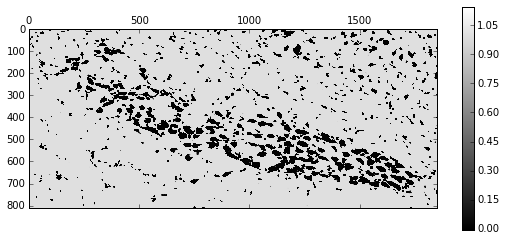

0.112747228996
73


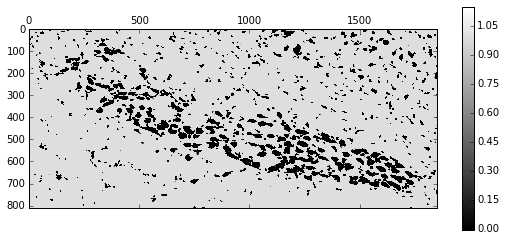

0.10754596795
74


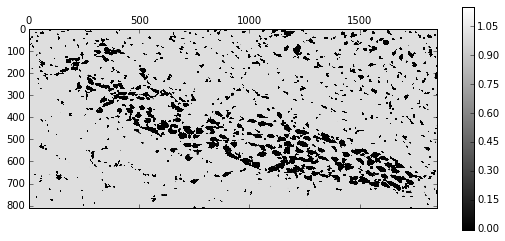

0.0995355179832
75


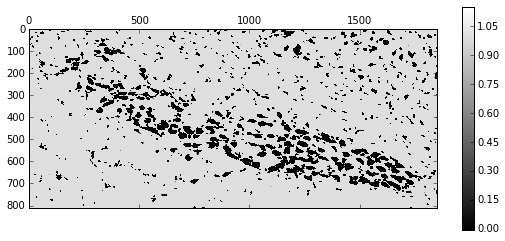

0.0981179610807
76


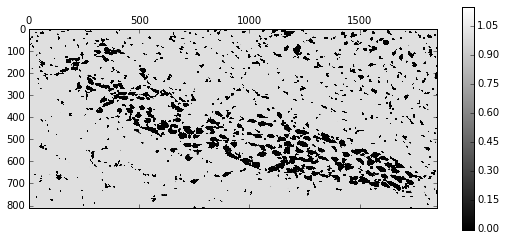

0.095877919338
77


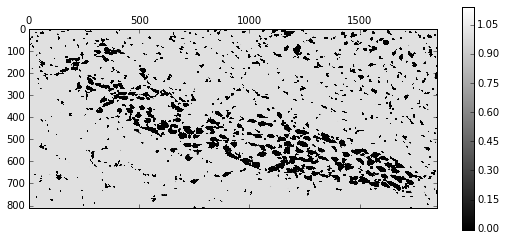

0.0883809343185
78


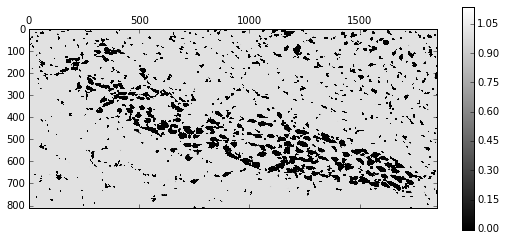

0.0842570651899
79


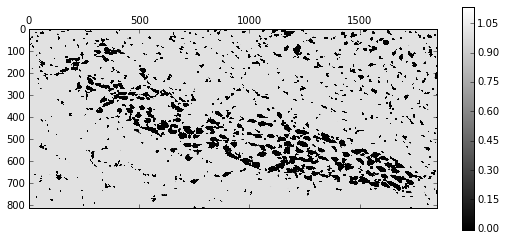

0.0813027167456
80


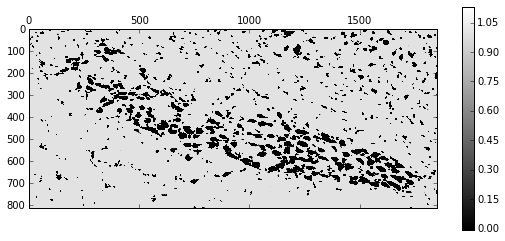

0.0826653815215
81


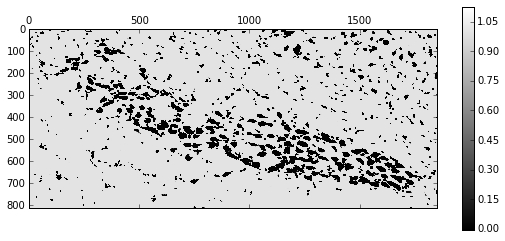

0.0825833896683
82


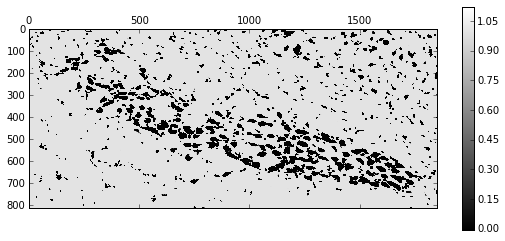

0.0800751429797
83


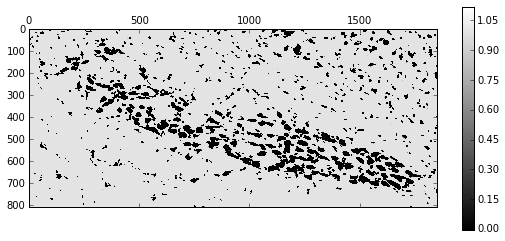

0.0732596009684
84


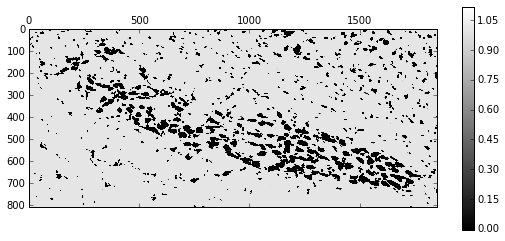

0.069711343894
85


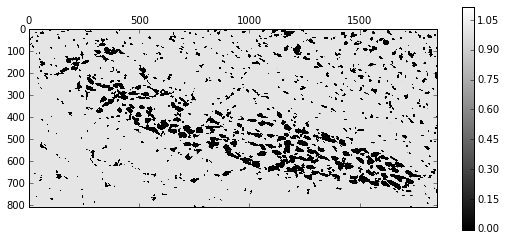

0.0683880287277
86


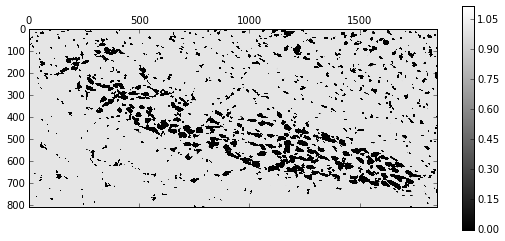

0.067854296276
87


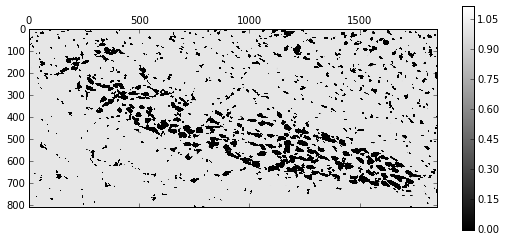

0.0678974249809
88


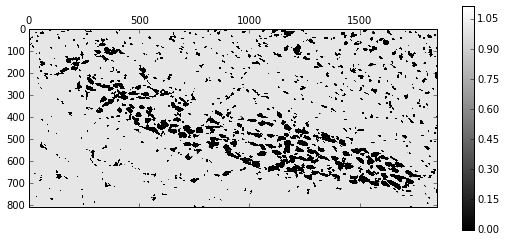

0.0648532977734
89


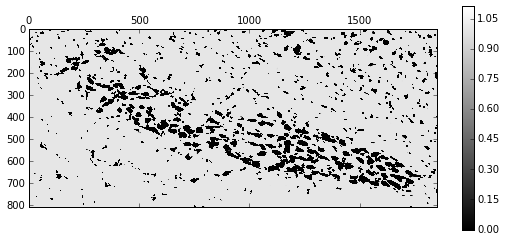

0.0617621849139
90


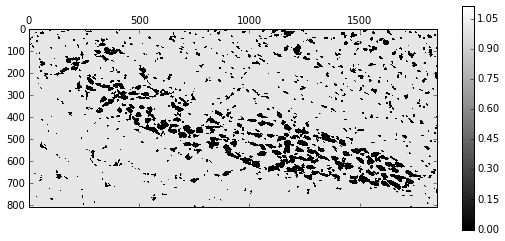

0.0622759957043
91


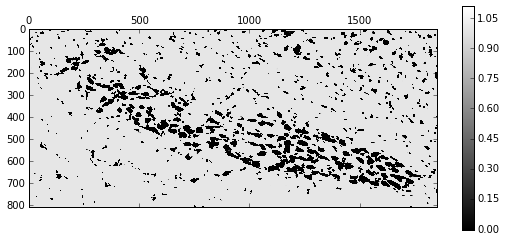

0.0613913652594
92


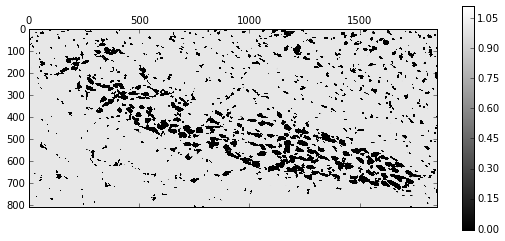

0.0621619143651
93


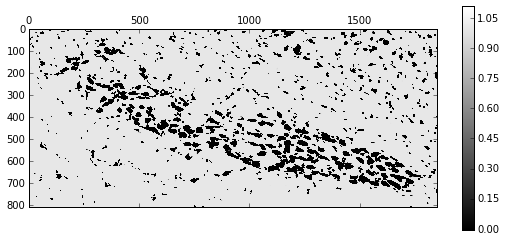

0.0671851260054
94


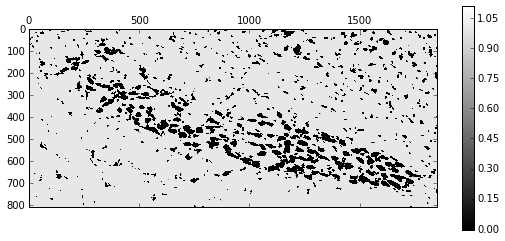

0.0683413767312
95


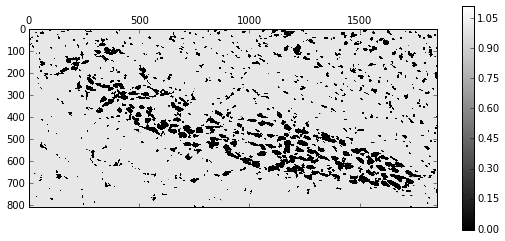

0.0683287158968
96


KeyboardInterrupt: 

In [322]:
# h, w = px.shape
# dpx_dx = np.c_[np.zeros((h,1)), np.diff(px, axis=1)]
# dpy_dy = np.r_[np.zeros((1,w)), np.diff(py, axis=0)]

dt = 1./8
theta = 1.
lamb = .01
# lamb = .0001
mu = .5

u = np.zeros_like(img, np.float)
v = np.zeros_like(img, np.float)

for k in range(100):
    print k

    px = np.zeros_like(u)
    py = np.zeros_like(u)

    for i in range(10):
        _, dpx_dx = np.gradient(px)
        dpy_dy, _ = np.gradient(py)

        div_p = dpy_dy + dpx_dx

        a = div_p - v/theta
        dady, dadx = np.gradient(a)
        norm_da = np.sqrt(dady**2+dadx**2)
        denom = 1+dt/g*(norm_da+1e-6)
        py = (py + dt*dady)/denom
        px = (px + dt*dadx)/denom

    u = v - theta*div_p
    
    if k%5 == 0:
        c1 = f[u>mu].mean()
        if np.isnan(c1):
            print 'c1 is nan'
            c1 = 255.        # change to 1. if float
        c2 = f[u<=mu].mean()
        r1 = (c1-f)**2-(c2-f)**2
            
    plt.matshow(u, cmap=plt.cm.gray)    
#     plt.matshow(u>mu, cmap=plt.cm.gray)
    plt.colorbar()
    plt.show()
    
    v = np.minimum(1, np.maximum(0, u-theta*lamb*r1))
    
    if k > 1:
        change = np.max(np.r_[np.abs(u-u_prev), np.abs(v-v_prev)])
        print change
        if change < 1e-5:
            break
    
    u_prev = u
    v_prev = v
    
#     plt.matshow(v)
# #     plt.matshow(r1)
#     plt.colorbar()
#     plt.show()

plt.matshow(u>mu, cmap=plt.cm.gray)
plt.colorbar()
plt.show()

print c1, c2


In [96]:
du_dy_forward = np.diff(u, axis=0)
du_dy_backward = -np.diff(u, axis=0)
du_dy_forward = np.vstack([du_dy_forward, du_dy_forward[-1]])
du_dy_backward = np.vstack([du_dy_backward[0], du_dy_backward])

du_dx_forward = np.diff(u, axis=1)
du_dx_backward = -np.diff(u, axis=1)
du_dx_forward = np.c_[du_dx_forward, du_dx_forward[:,-1]]
du_dx_backward = np.c_[du_dx_backward[:,0], du_dx_backward]

du_dy_center, du_dx_center = np.gradient(u)

In [99]:
dg_dy_center, dg_dx_center = np.gradient(g)

In [226]:
eps3 = .01
alpha = .1

dt = 1./8
lamb = .01

In [227]:
# u = np.zeros_like(img, np.float)
# u[150:180, 50:80] = 1.
u = img.astype(np.float)/img.max()

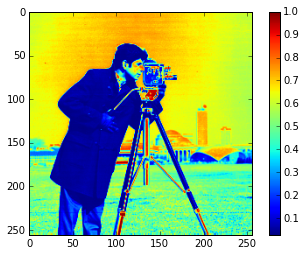

In [228]:
# u = reinitialize(u)

plt.imshow(u);
plt.colorbar();

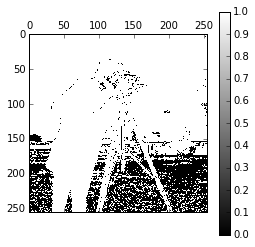

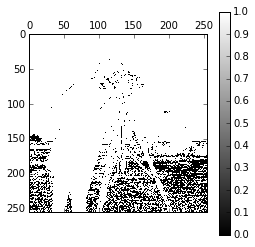

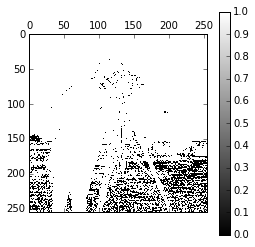

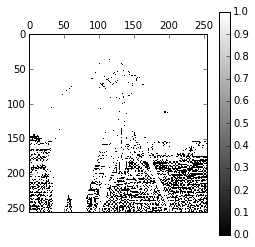

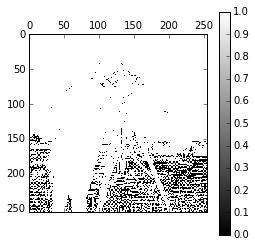

...

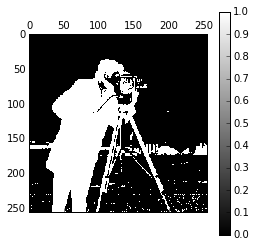

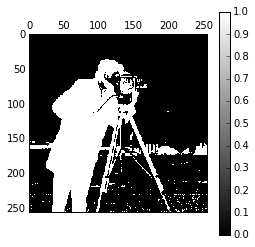

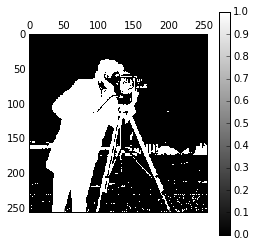

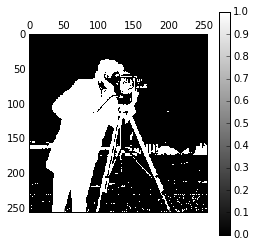

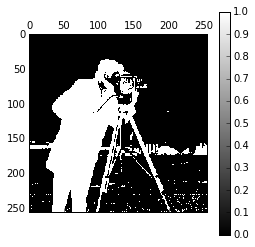

In [232]:
u = np.zeros_like(img, np.float)

for k in range(100):

    norm_du = np.sqrt(du_dx_forward**2+du_dy_forward**2+1e-12)
    norm_du_center = np.sqrt(du_dx_center**2+du_dy_center**2+1e-4)

    dv = np.zeros_like(u)
    dv[u < -eps3] = -2.
    dv[(u >= -eps3) & (u < eps3)] = (u[(u >= -eps3) & (u < eps3)]-eps3)/eps3
    dv[(u >= eps3) & (u < 1-eps3)] = 0
    dv[(u >= 1-eps3) & (u < 1+eps3)] = -(1-u[(u >= 1-eps3) & (u < 1+eps3)]-eps3)/eps3
    dv[u >= 1+eps3] = 2.

    if k%3 == 0:
        c1 = f[u>mu].mean()
        if k == 0:
            c1 = 1
        c2 = f[u<=mu].mean()
        r = (c1-f)**2-(c2-f)**2

    a_x = du_dx_forward/norm_du
    aa_x = -np.diff(a_x, axis=1)
    aa_x = np.c_[aa_x[:,0], aa_x]

    a_y = du_dy_forward/norm_du
    aa_y = -np.diff(a_y, axis=0)
    aa_y = np.vstack([aa_y[0], aa_y])
    
    d = g*(aa_x + aa_y) + \
    np.maximum(0, dg_dx_center)*du_dx_backward/norm_du_center + \
    np.minimum(0, dg_dx_center)*du_dx_forward/norm_du_center + \
    np.maximum(0, dg_dy_center)*du_dy_backward/norm_du_center + \
    np.minimum(0, dg_dy_center)*du_dy_forward/norm_du_center - \
    lamb*r - alpha*dv

    u = u + d*dt
            
    plt.matshow(u > .5, cmap=plt.cm.gray)
    plt.colorbar()
    plt.show()

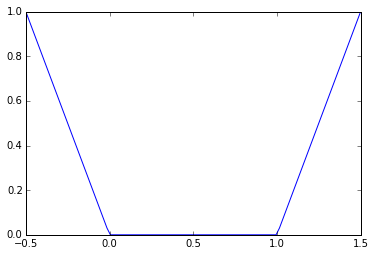

In [119]:
e = np.linspace(-0.5,1.5,100)
plt.plot(e, np.maximum(0, 2*np.abs(e-.5)-1))

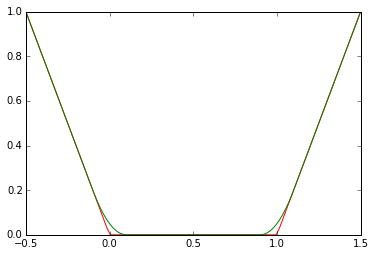

In [163]:
# e = np.linspace(-eps3, 1+eps3, 100)
eps3 = .01
e = np.linspace(-.5, 1.5, 100)

plt.plot(e, np.maximum(0, 2*np.abs(e-.5)-1), c='r')

y = np.zeros_like(e)
y[e < -eps3] = 2*np.abs(e[e<-eps3]-.5)-1
y[(e >= -eps3) & (e < eps3)] = 1./(2*eps3)*(e[(e >= -eps3) & (e < eps3)]-eps3)**2
y[(e >= eps3) & (e < 1-eps3)] = 0
y[(e >= 1-eps3) & (e < 1+eps3)] = 1/(2*eps3)*(-(e[(e >= 1-eps3) & (e < 1+eps3)]-1.)-eps3)**2
y[e >= 1+eps3] = 2*np.abs(e[e>=1+eps3]-.5)-1

plt.plot(e, y)